# Greedy Iterated Local Search Graph Sampling 

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline
from eden.util import configure_logging
import logging
configure_logging(logging.getLogger(),verbosity=1)

from IPython.core.display import HTML
HTML('<style>.container { width:95% !important; }</style><style>.output_png {display: table-cell;text-align: center;vertical-align: middle;}</style>')

In [ ]:
import numpy as np
import scipy as sp

In [27]:
import pylab as plt
import math

def plot_scores(scores, num_graphs_per_plot = 4):
    num_plots = int(math.ceil(len(scores)/float(num_graphs_per_plot)))
    for i in range(num_plots):
        plt.figure(figsize=(13,5))
        start=i*num_graphs_per_plot
        end=i*num_graphs_per_plot+num_graphs_per_plot
        for j,score in enumerate(scores[start:end]):
            data = score
            plt.plot(data, linewidth=2, label='graph %d'%(j+i*num_graphs_per_plot))
            plt.plot(data, linestyle='None', markerfacecolor='white', markeredgecolor='k', marker='o', markeredgewidth=2,markersize=6)
        plt.legend(loc='upper left')
        plt.ylim(-.1,1.1)
        plt.grid()
        plt.show()

In [3]:
from sklearn.metrics.pairwise import cosine_similarity

def select_most_central(best_graphs, vec):
    x = vec.transform(best_graphs)
    sim_matrix = cosine_similarity(x)
    sim_score = np.mean(sim_matrix, axis=1)
    best_id = np.argmax(sim_score)
    return best_id

from sklearn.cluster import MiniBatchKMeans
def clusterize(graphs, vec, n_clusters=2):
    x = vec.transform(graphs)
    km = MiniBatchKMeans(n_clusters=n_clusters)
    classes = km.fit_predict(x)
    clusters=[]
    for reference_typeof in set(classes):
        cluster=[]
        for typeof, graph in zip(classes, graphs):
            if typeof == reference_typeof:
                cluster.append(graph)
        clusters.append(cluster)
    return clusters

def prototypes(graphs, vec, n_clusters=2):
    clusters = clusterize(graphs, vec, n_clusters)
    return [select_most_central(cluster, vec) for cluster in clusters]

# Set up source of graphs

In [4]:
assay_id = '651610' #apr93 23k mols
assay_id = '1834'   #apr90 500 mols
assay_id = '624466' #apr88 p5k n23k
assay_id = '588350' #apr86 p1k n600
assay_id = '449764' #apr85
assay_id = '492952' #apr85
assay_id = '463112' #apr82
assay_id = '463213' #apr70
assay_id = '119'    #apr60 30k mols
assay_id = '1224857'#apr10
assay_id = '2326'   #apr03 200k mols

#-------------------------------------------------
# choose
assay_id = '588350' #apr86 p1k n600

In [5]:
from toolz import curry, pipe
from eden_chem.io.pubchem import download
from eden_chem.obabel import load as babel_load

download_active = curry(download)(active=True)
download_inactive = curry(download)(active=False)


def get_pos_graphs(assay_id): return pipe(assay_id, download_active, babel_load, list)
def get_neg_graphs(assay_id): return pipe(assay_id, download_inactive, babel_load, list)


def get_graphs(): return get_pos_graphs(assay_id)

In [6]:
from eden.graph import Vectorizer
vec = Vectorizer(complexity=3, n_jobs=1, normalization=False, inner_normalization=False)
graphs = get_graphs()

In [7]:
from eden.display import map_labels_to_colors
label_colors = map_labels_to_colors(graphs)

from graphlearn.utils import draw
draw_params=dict(n_graphs_per_line=6, size=8, 
                colormap='Paired', vertex_color='_labels_', 
                vertex_color_dict=label_colors,
                vertex_alpha=0.5, edge_alpha=0.2)

In [8]:
# extract pos and neg graphs
pos_graphs = get_pos_graphs(assay_id)
neg_graphs = get_neg_graphs(assay_id)
all_graphs = pos_graphs + neg_graphs

In [9]:
print('n pos=%5d'%len(pos_graphs))
print('n neg=%5d'%len(neg_graphs))

n pos= 1232
n neg=  634


In [10]:
def min_similarity_selection(matrix, scores=None, max_num=None):
    """Select the max_num most dissimialr instances.
    
    Given a similarity matrix and a score associate to each instance,
    iteratively find the most similar pair and remove the one with the 
    smallest score until only max_num remain.
    """
    similarity_matrix = matrix.copy()
    size = similarity_matrix.shape[0]
    # remove diagonal elements, so that sim(i,i)=0 and the pair i,i is not selected
    similarity_matrix = similarity_matrix - np.diag(np.diag(similarity_matrix))
    # iterate size - k times, i.e. until only k instances are left
    for t in range(size - max_num):
        # find pairs with largest similarity
        (i,j) = np.unravel_index(np.argmax(similarity_matrix), similarity_matrix.shape)
        # choose instance with smallest score as the one to be removed
        if scores[i] < scores[j]:
            id = i
        else:
            id = j
        # remove instance with lower score by setting all its pairwise similaritites to 0
        similarity_matrix[id, :] = 0
        similarity_matrix[:, id] = 0
    # extract surviving elements, i.e. element that have a row that is not only 0s
    select_ids = [i for i, row in enumerate(similarity_matrix) if np.sum(row)>0]
    return select_ids


from sklearn.model_selection import cross_val_predict
from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.neighbors import NearestNeighbors
def compute_score(x, y, k=5):
    # induce classification model and compute crossvalidated confidence
    # compute std estimate of the score for each instance
    y_preds = []
    n_iterations = 5
    for rnd in range(n_iterations):
        sgd = SGDClassifier(average=True, class_weight='balanced', shuffle=True, n_jobs=-1, random_state=rnd)
        cv = StratifiedKFold(n_splits=5, random_state=rnd)
        y_pred = cross_val_predict(sgd, x, y, method='decision_function', cv=cv)
        y_preds.append(y_pred)
    y_preds = np.array(y_preds).T
    mean_y_preds = np.mean(y_preds, axis=1)
    std_y_preds = np.std(y_preds, axis=1)
    # predictive score is the mean+std
    preds = mean_y_preds + std_y_preds
    # compute score averaging k neighbors
    nn = NearestNeighbors()
    nn.fit(x)
    distances, neighbors = nn.kneighbors(x, k)
    avg_pred_scores = np.mean(preds[neighbors],axis=1)
    # NOTE: if one instance is duplicated, then the distance is 0 and the volume collapses to 0
    avg_dist_scores = sp.stats.mstats.gmean(distances,axis=1)
    vol_scores = sp.stats.mstats.gmean(avg_dist_scores[neighbors],axis=1)
    # score is product of volume and average estimated score
    # the idea is to find the largest volume, i.e. the most diverse set
    # that is at the same time high scoring
    scores = avg_pred_scores * vol_scores
    return scores


def make_data(pos_graphs, neg_graphs):
    # prepare x,y
    y = [1]*len(pos_graphs)+[-1]*len(neg_graphs)
    all_graphs = pos_graphs + neg_graphs
    x = vec.transform(all_graphs)
    return all_graphs, x, y


from sklearn.metrics.pairwise import cosine_similarity
def select_diverse_representative_set(all_graphs, x, scores, size=18, top_perc=0.1):    
    # sort ids from the most uncertain average prediction
    ids = np.argsort(-scores)
    # select a perc of the num of positives
    k_top_scoring = int(len(all_graphs)*top_perc) 
    sel_ids = ids[:k_top_scoring]
    sel_vecs = x[sel_ids]
    sel_scores = scores[sel_ids]    
    # compute the similarity matrix as cos similarity
    similarity_matrix = cosine_similarity(sel_vecs)
    # select 'size' most different instances 
    rel_seed_ids = min_similarity_selection(similarity_matrix, scores=sel_scores, max_num=size)
    seed_ids = [sel_ids[i] for i in rel_seed_ids]
    sel_seed_graphs = [all_graphs[gid] for gid in seed_ids]
    return seed_ids, sel_seed_graphs


def select_diverse_representative_set_for_positives(pos_graphs, neg_graphs, size=18, top_perc=0.1, k=5):
    all_graphs, x, y = make_data(pos_graphs, neg_graphs)
    # compute score as mean confidence in k neighbors
    scores = compute_score(x, y, k)
    dat = select_diverse_representative_set(all_graphs, x, scores, size, top_perc) 
    seed_ids, sel_seed_graphs = dat
    seed_scores = scores[seed_ids]
    return seed_ids, sel_seed_graphs, seed_scores


def select_diverse_representative_active_set(pos_graphs, neg_graphs, size=18, top_perc=0.1, k=5):
    all_graphs, x, y = make_data(pos_graphs, neg_graphs)
    # compute score as mean confidence in k neighbors
    scores = compute_score(x, y, k)
    # score is high if the prediction is near zero 
    ambiguity_scores = 1/(1+np.absolute(scores)) 
    dat = select_diverse_representative_set(all_graphs, x, ambiguity_scores, size, top_perc) 
    seed_ids, sel_seed_graphs = dat
    seed_scores = scores[seed_ids]
    return seed_ids, sel_seed_graphs, seed_scores

id= 1307  score=  -1886.90
id=  681  score=   2571.34
id= 1479  score=   8970.24
id= 1593  score= -10645.76
id= 1346  score=  12177.99
id=  865  score= -13954.69
id=  636  score= -15204.68
id= 1586  score= -18878.55
id=  973  score= -20470.88
id=  261  score= -26231.08
id=   68  score= -45167.94
id= 1550  score=  56279.50


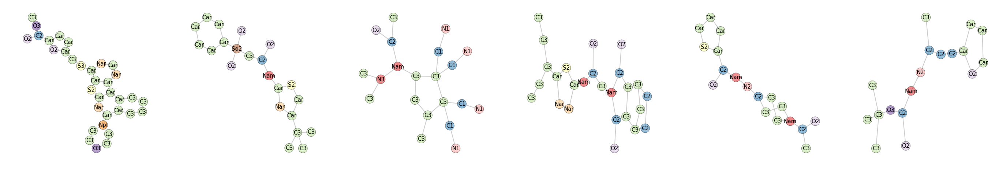

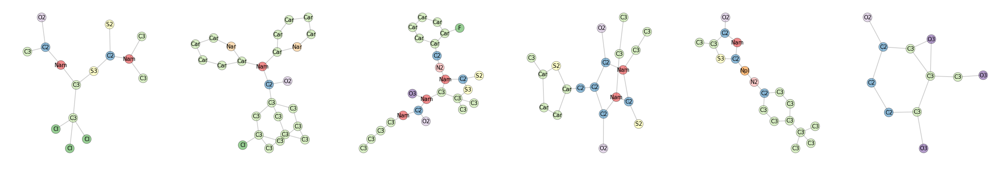

CPU times: user 27.6 s, sys: 867 ms, total: 28.5 s
Wall time: 30.4 s


In [11]:
%%time
data = select_diverse_representative_active_set(pos_graphs, neg_graphs, size=12)
active_seed_ids, active_sel_seed_graphs, active_seed_scores = data
for i,s in zip(active_seed_ids, active_seed_scores): print('id=%5d  score=%10.2f'%(i,s))
draw.graphlearn(active_sel_seed_graphs, **draw_params) 

id=  466  score=1246160.18
id= 1596  score= 912338.62
id=  472  score= 805621.92
id=  698  score= 767793.03
id= 1684  score= 693135.07
id=  338  score= 672612.21
id=  736  score= 671266.22
id=  922  score= 662360.48
id= 1252  score= 654066.03
id= 1076  score= 646541.53
id=  687  score= 644858.84
id=  392  score= 633865.47


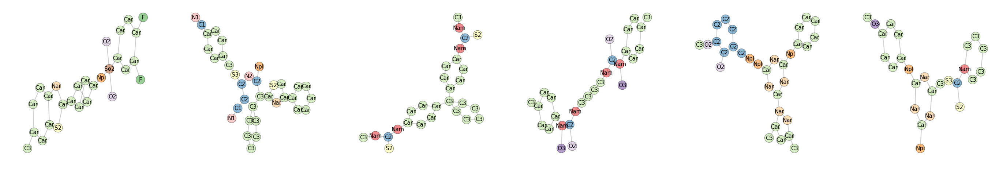

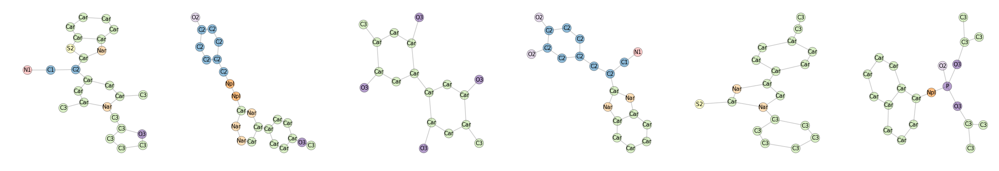

CPU times: user 28.8 s, sys: 890 ms, total: 29.6 s
Wall time: 31.2 s


In [12]:
%%time
data = select_diverse_representative_set_for_positives(pos_graphs, neg_graphs, size=12)
seed_ids, sel_seed_graphs, seed_scores = data
for i,s in zip(seed_ids, seed_scores): print('id=%5d  score=%10.2f'%(i,s))
draw.graphlearn(sel_seed_graphs, **draw_params) 

In [13]:
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics.pairwise import euclidean_distances
import numpy as np

class DistanceEstimator():
    
    def __init__(self, reference_vecs, desired_distances, weights=None):
        self.reference_vecs = reference_vecs
        self.desired_distances = desired_distances
        if weights is None:
            # compute weights as a normalized reciprocals of distances 
            self.weights = self.weights(desired_distances)
        else:
            self.weights = weights
            
    def weights(self, desired_distances):
        _epsilon=1
        d = np.array(desired_distances)
        dn = (d+_epsilon)/(np.sum(d)+_epsilon)
        idn = 1/np.square(dn)
        nidn = (idn+_epsilon)/(np.sum(idn)+_epsilon)
        return nidn
        
    def fit(self,arg,**args):
        # the init phase is all that is needed for fitting
        pass
    
    def predict(self, vector):
        # compute the distance to each of the reference vectors
        distances = euclidean_distances(vector, self.reference_vecs)[0]
        # score the discrepancy w.r.t. the desired distances
        abs_diff = np.abs(distances - self.desired_distances)
        weighted_abs_diff = np.multiply(self.weights, abs_diff)
        discrepancy = np.mean(weighted_abs_diff)
        # convert it to a similarity value to maximize
        similarity = 1/(1+discrepancy)
        return similarity

# Select a reference graph and its neighbors

In [14]:
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics.pairwise import cosine_similarity

def extract_neighbors(reference_vec, graphs, n_neighbors=4):
    X = vec.transform(graphs)
    nbrs = NearestNeighbors(n_neighbors=n_neighbors+1).fit(X)
    distances, indices = nbrs.kneighbors(reference_vec)
    if distances[0][0] == 0:
        distances = distances[0][1:]
        indices = list(indices[0])[1:]
    else:
        distances = distances[0][:-1]
        indices = list(indices[0])[:-1]        
    neighbor_graphs = [graphs[i] for i in indices]
    reference_vecs = vec.transform(neighbor_graphs)
    weights = cosine_similarity(reference_vec, reference_vecs)[0]
    weights = weights / sum(weights)
    return neighbor_graphs, reference_vecs, distances, weights

In [15]:
i=seed_ids[0]
n_neighbors = 6

reference_graph = all_graphs[i]
reference_vec = vec.transform([reference_graph])
data = extract_neighbors(reference_vec, graphs, n_neighbors=n_neighbors)
data = neighbor_graphs, reference_vecs, desired_distances, weights = data
est = DistanceEstimator(reference_vecs, desired_distances, weights)

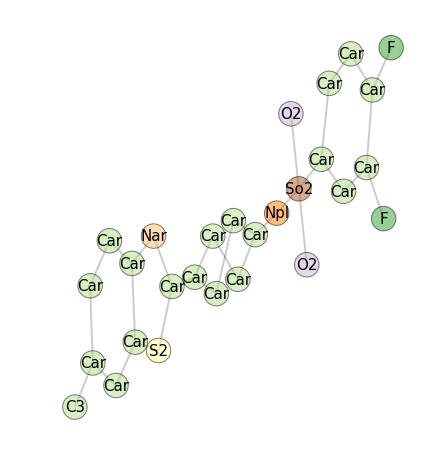

 0 d= 76.6 w=0.181
 1 d= 81.2 w=0.176
 2 d= 85.1 w=0.169
 3 d= 89.2 w=0.158
 4 d= 89.5 w=0.158
 5 d= 90.7 w=0.158


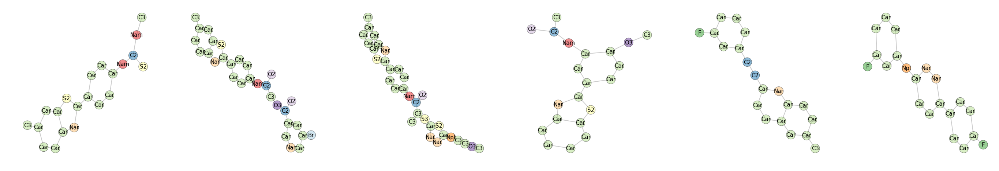

In [16]:
draw.graphlearn([reference_graph], **draw_params) 
for n, (d,w) in enumerate(zip(desired_distances, est.weights)): print('%2d d=%5.1f w=%5.3f'%(n,d,w))
draw.graphlearn(neighbor_graphs, **draw_params) 

In [17]:
# compute geometric mean vector to be used as reference vec
import scipy as sp
avg_reference_vec = sp.sparse.csr_matrix.mean(reference_vecs, axis=0)

In [18]:
n_neighbors = 6
data = extract_neighbors(avg_reference_vec, graphs, n_neighbors=n_neighbors)
neighbor_graphs, reference_vecs, desired_distances, weights = data
est = DistanceEstimator(reference_vecs, desired_distances, weights)

 0 d= 36.9 w=0.179
 1 d= 49.5 w=0.178
 2 d= 49.9 w=0.161
 3 d= 50.5 w=0.173
 4 d= 51.8 w=0.161
 5 d= 54.6 w=0.149


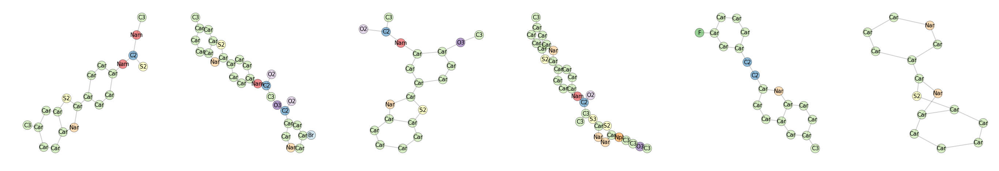

In [19]:
for n, (d,w) in enumerate(zip(desired_distances, est.weights)): print('%2d d=%5.1f w=%5.3f'%(n,d,w))
draw.graphlearn(neighbor_graphs, **draw_params) 

# Setup the greedy ILS 

In [20]:
from graphlearn.graphlearn import  Sampler
from graphlearn.utils.neighbors import graph_neighbors
import random

class GreedyIteratedLocalSearchSampler(Sampler):
    
    def _greedy_step(self, graph):
        grammar = self.lsgg
        transformer = self.graph_transformer
        score_func = self._score
        neighbors = list(graph_neighbors(graph, grammar, transformer))
        max_score, max_graph = max(map(lambda g:(score_func(g),g), neighbors))
        return max_graph
    
    def _random_step(self, graph):
        grammar = self.lsgg
        transformer = self.graph_transformer
        neighbors = list(graph_neighbors(graph, grammar, transformer))
        return random.choice(neighbors)
    
    def _random_steps(self, graph, n_steps=1):
        next_graph = graph
        for i in range(n_steps):
            next_graph = self._random_step(next_graph)
        return next_graph
    
    def _choose_proposal(self, graph):
        # if the objective is reached within epsilon then stop
        _epsilon = 0.1
        if self._score(graph) > 1 - _epsilon:
            return graph
        # else find the best neighbor
        best_neighbor = self._greedy_step(graph)
        # if it is an improvement then always select it
        if self._score(best_neighbor) > self._score(graph):
            return best_neighbor
        # else select a random neighbor
        else:
            random_neighbor = self._random_steps(graph, n_steps=1)
            # NOTE: apparently we need to compute the score on the instance
            # before returning it, or else the code crashes !?
            s = self._score(random_neighbor)
            return random_neighbor

# Setup the sampler

In [21]:
%%time
from graphlearn.localsubstitutablegraphgrammar import LocalSubstitutableGraphGrammar as lsgg
n=75
sampler=GreedyIteratedLocalSearchSampler(
    estimator=est,
    vectorizer=vec,
    grammar=lsgg(radius_list=[0,1],
                 thickness_list=[1],
                 min_cip_count=4,min_interface_count=2), 
    n_samples=n,
    n_steps=n,
    accept_static_penalty=-1, # needed to accept not improving moves, i.e. the random steps
    include_seed=True,
    keep_duplicates=True,
    n_jobs=1,
    monitor=True)

CPU times: user 57 µs, sys: 16 µs, total: 73 µs
Wall time: 69.9 µs


# Fit the grammar

In [22]:
%%time
sampler.fit(all_graphs)
n, i, c, p = sampler.grammar().size()
print('#instances: %d   #interfaces: %d   #cores: %d   #core-interface-pairs: %d' % (n, i, c, p))

#instances: 1866   #interfaces: 332   #cores: 269   #core-interface-pairs: 1529
CPU times: user 37.7 s, sys: 3.06 s, total: 40.8 s
Wall time: 40.4 s


# Sample and show generated graphs

In [23]:
import multiprocessing
from eden import apply_async

def sample_graph(seed_graph, sampler):
    samples = list(sampler.transform([seed_graph]))
    scores = sampler.monitors[0].sampling_info['score_history']
    return samples, scores
    
def sample_graphs(seed_graphs, sampler):
    pool = multiprocessing.Pool()
    sample_graphs_scores = [apply_async(pool,sample_graph,args=(seed_graph, sampler)) for seed_graph in seed_graphs]
    sample_graphs_scores_list = [p.get() for p in sample_graphs_scores]
    pool.close()
    pool.join()
    return sample_graphs_scores_list

def sample_graphs_scores_list_monotone_filter(sample_graphs_scores_list):
    scores = []
    sample_graphs_list = []
    for i, sample_graphs_scores in enumerate(sample_graphs_scores_list):
        _sample_graphs, _scores = sample_graphs_scores
        _score = []
        _graphs = []
        max_score = 0
        for s, g in zip(_scores, _sample_graphs[0]):
            if s > max_score:
                max_score = s
                _score.append(s)
                _graphs.append(g)
        scores.append(_score)
        sample_graphs_list.append(_graphs)
    return scores, sample_graphs_list

def sample_monotone_graphs(seed_graphs, sampler):
    sample_graphs_scores_list = sample_graphs(seed_graphs, sampler)
    scores, sample_graphs_list = sample_graphs_scores_list_monotone_filter(sample_graphs_scores_list)
    return scores, sample_graphs_list

In [24]:
%%time
# use as seeds the neighbors, the active  and some other random graphs 
import random
random_graphs = [random.choice(all_graphs) for i in range(len(neighbor_graphs))]
seed_graphs = neighbor_graphs + active_sel_seed_graphs + random_graphs
scores, sample_graphs_list = sample_monotone_graphs(seed_graphs, sampler)

CPU times: user 1min 53s, sys: 5.44 s, total: 1min 59s
Wall time: 1h 1min 48s


seed graphs


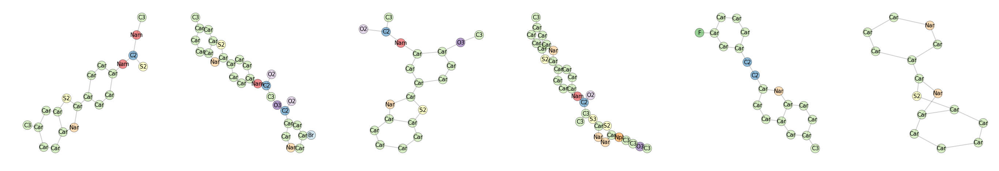

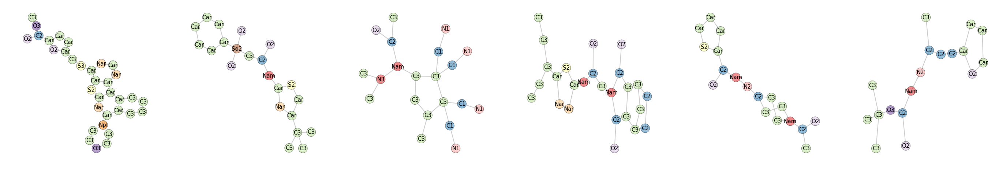

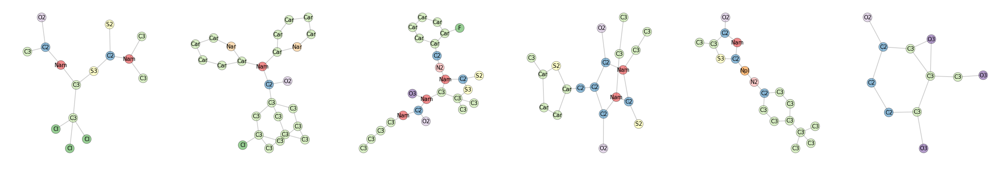

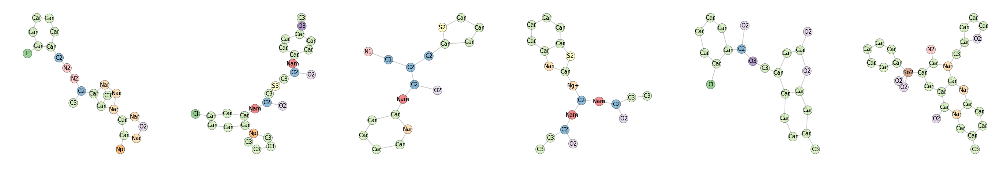

best result


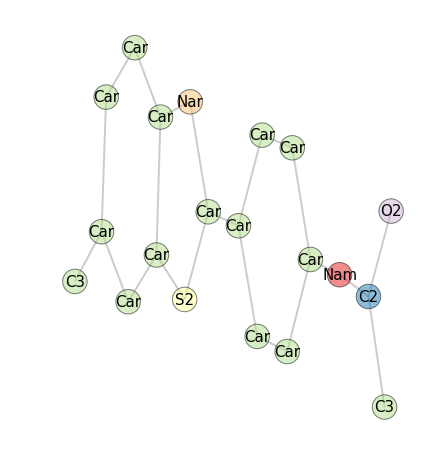

best graphs


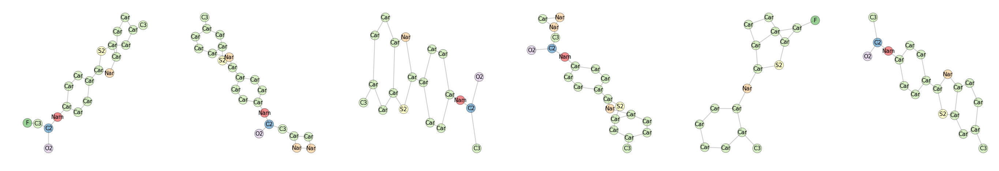

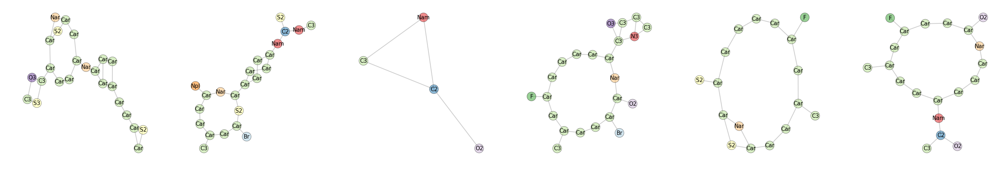

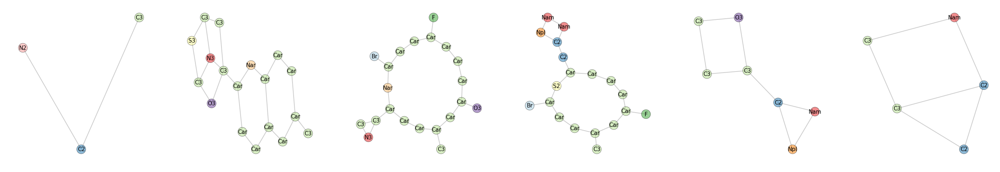

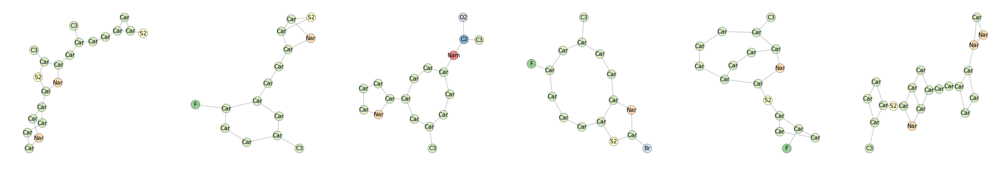

score history


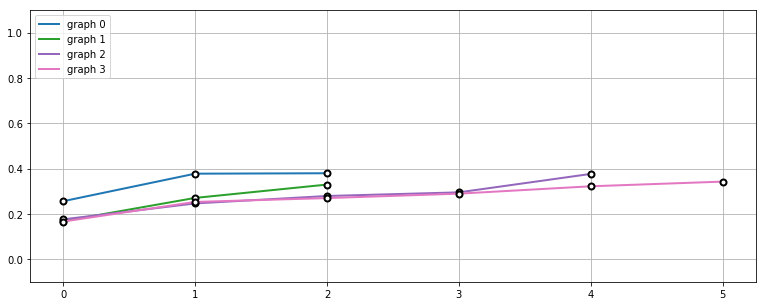

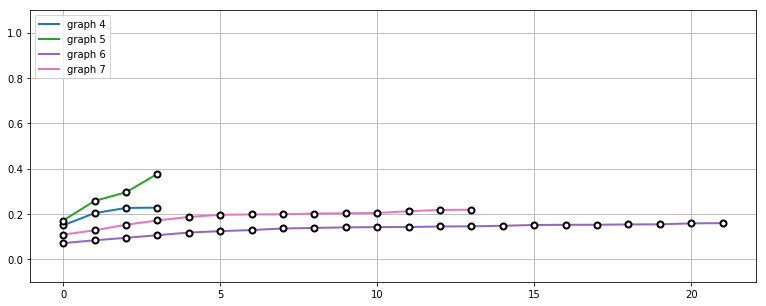

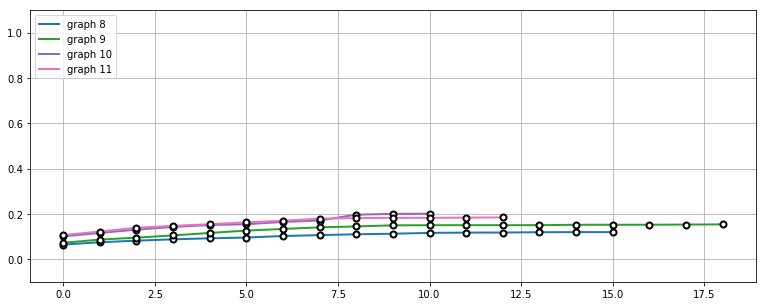

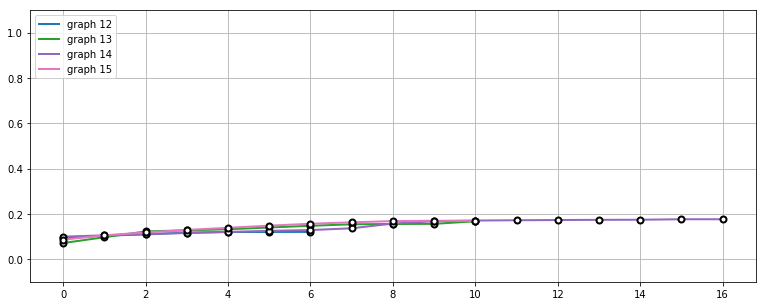

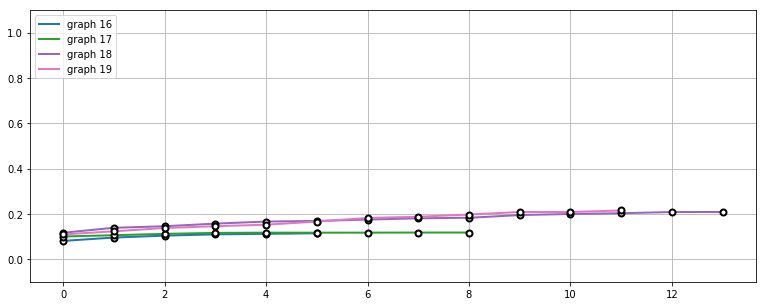

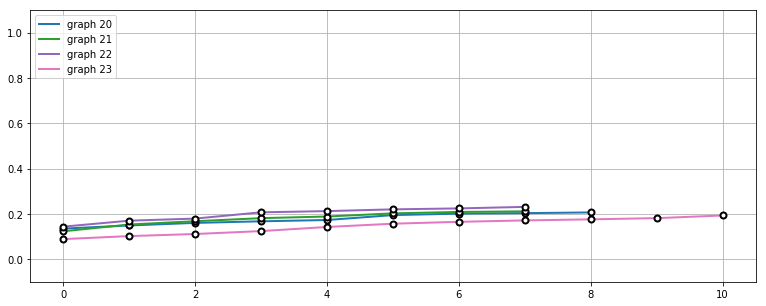

graph history

Graph id: 0


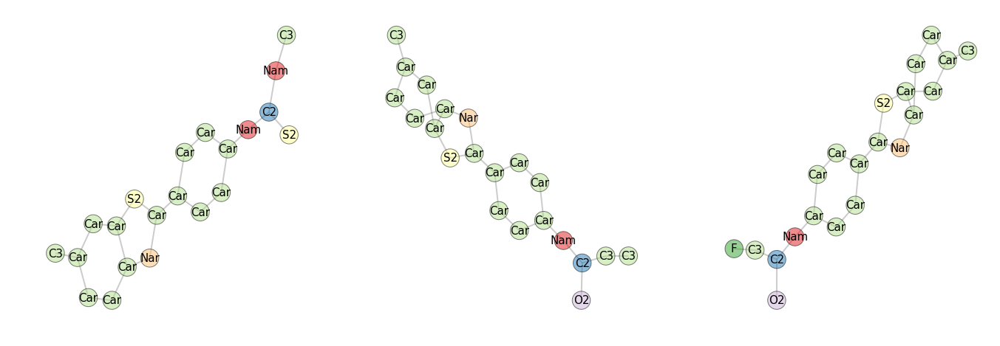


Graph id: 1


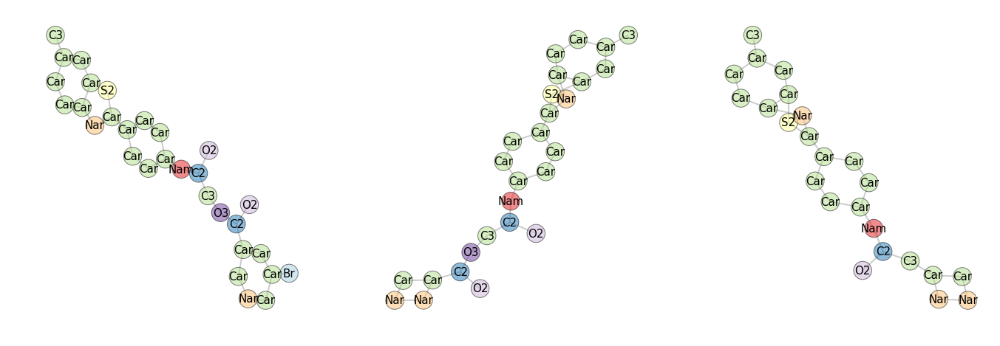


Graph id: 2


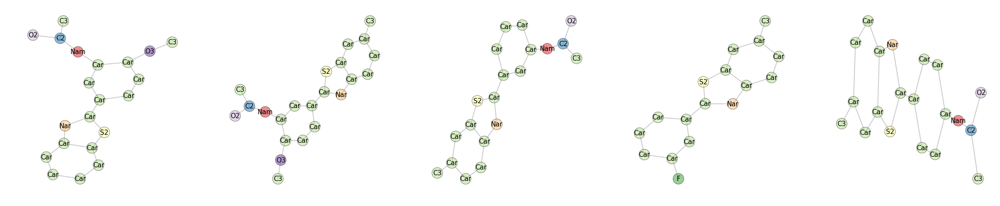


Graph id: 3


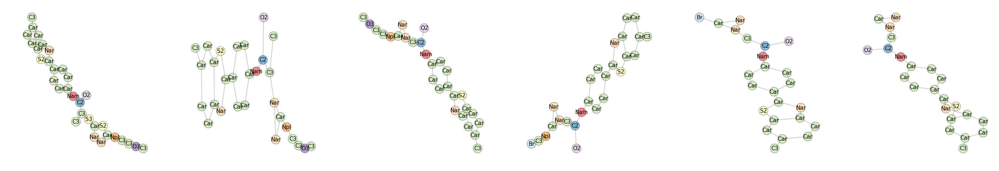


Graph id: 4


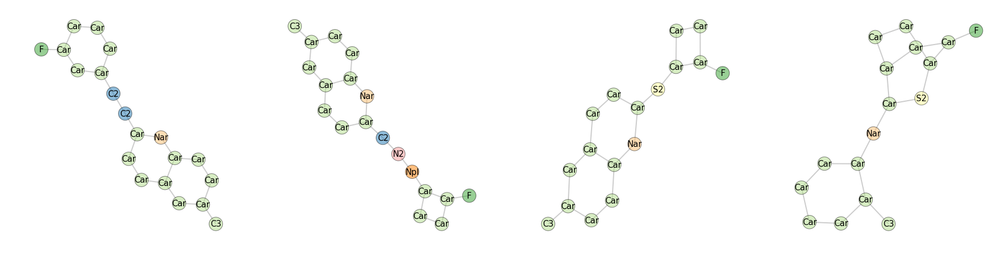


Graph id: 5


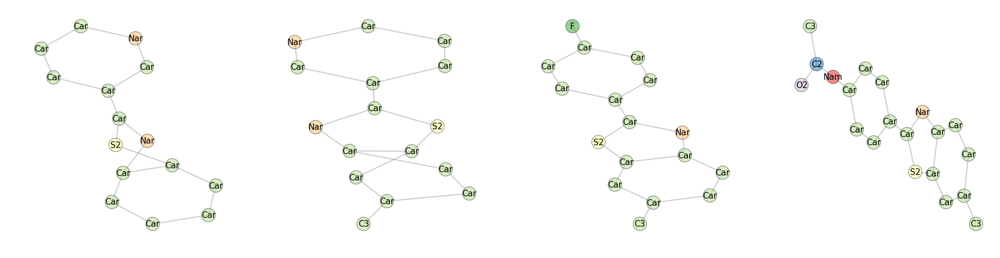


Graph id: 6


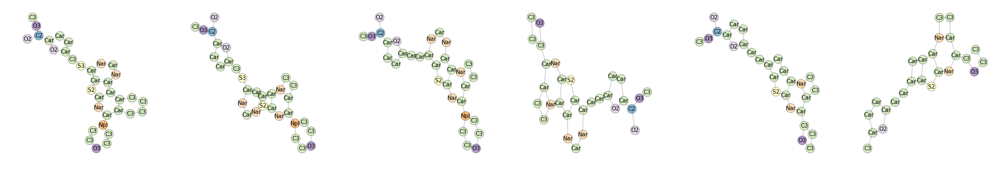

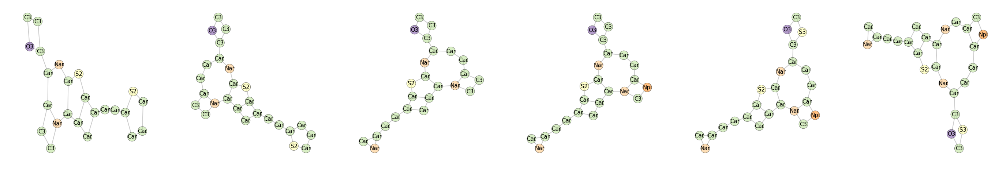

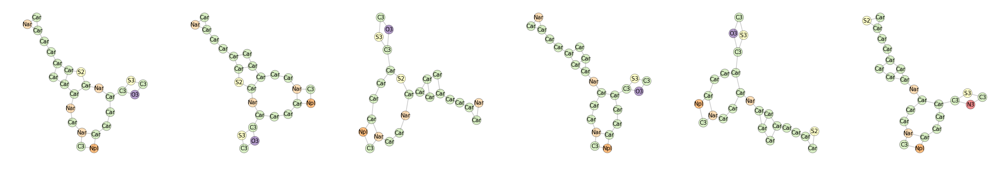

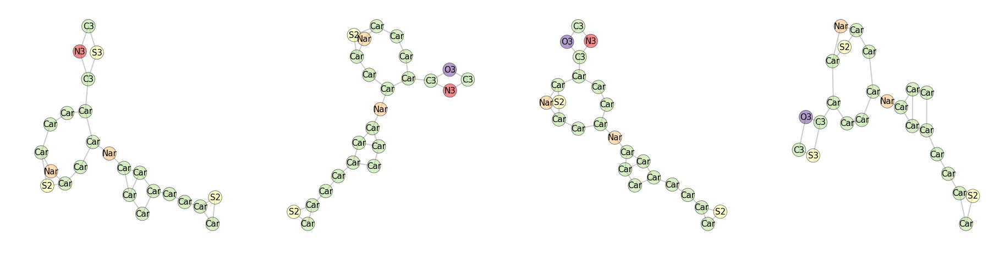


Graph id: 7


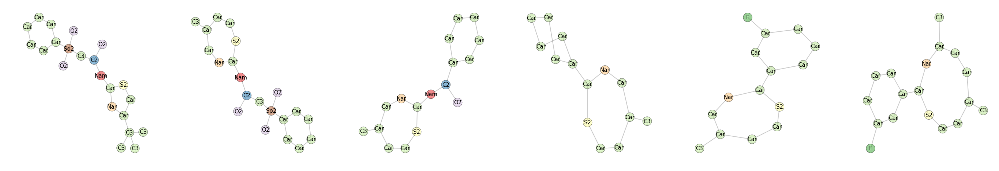

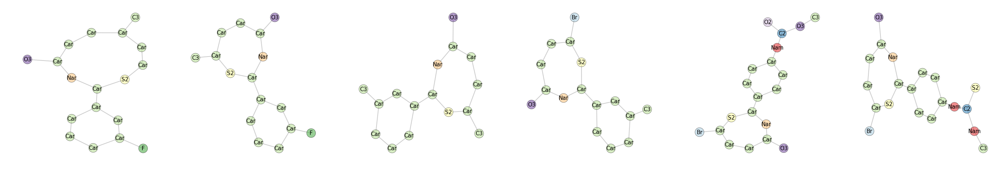

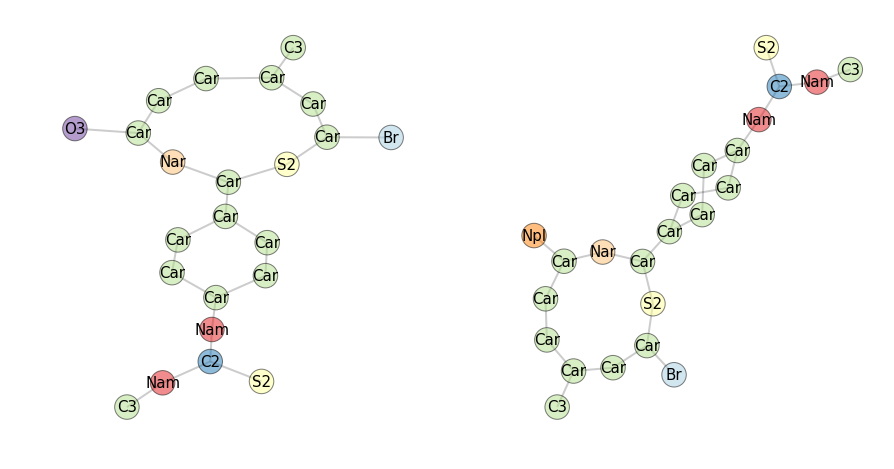


Graph id: 8


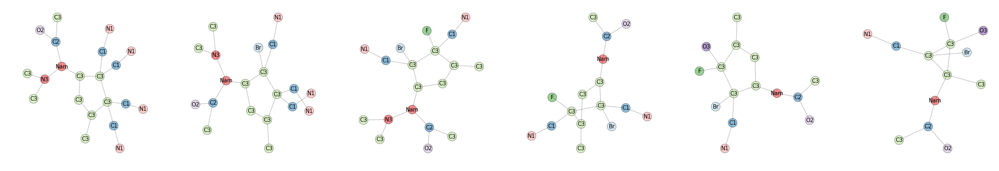

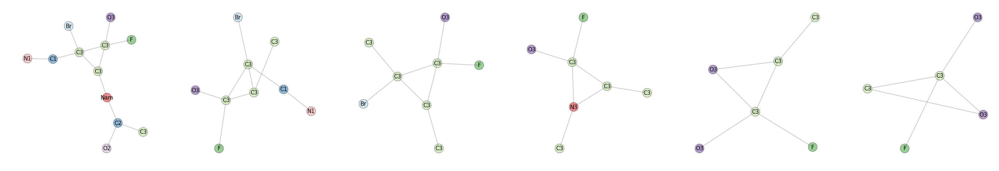

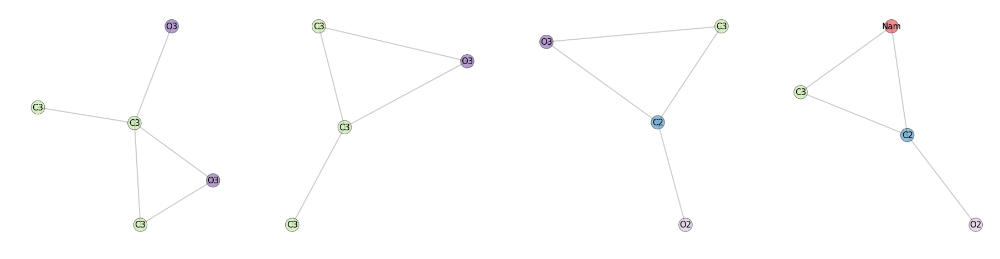


Graph id: 9


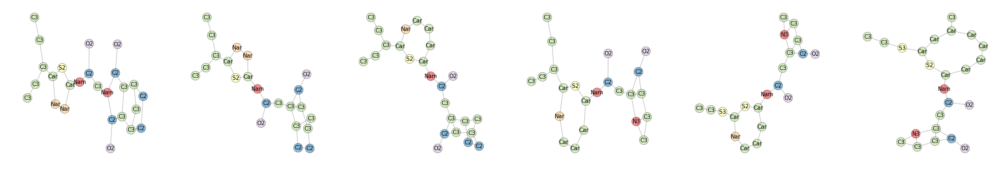

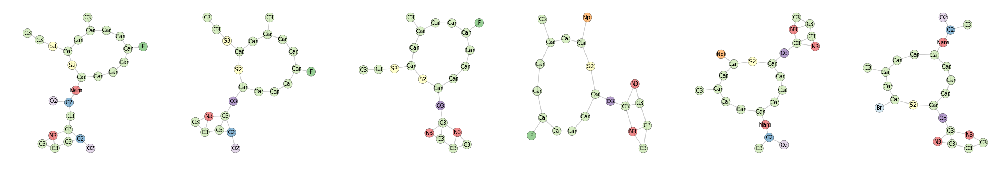

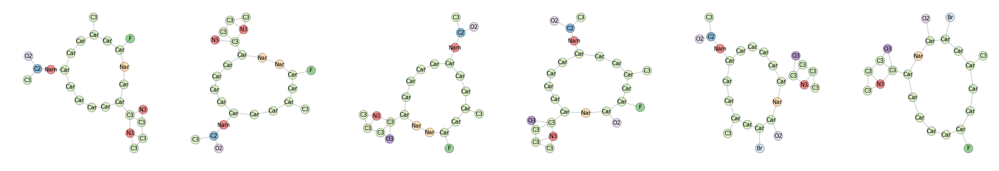

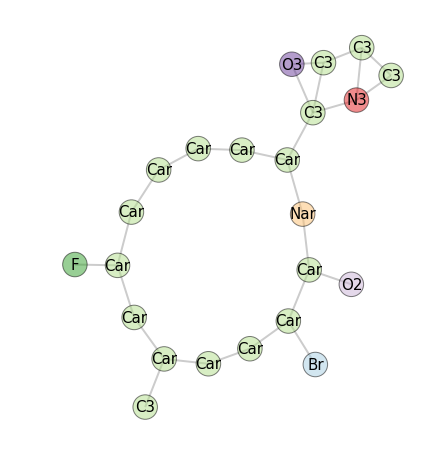


Graph id: 10


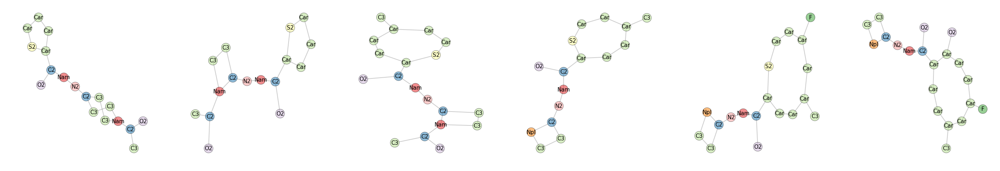

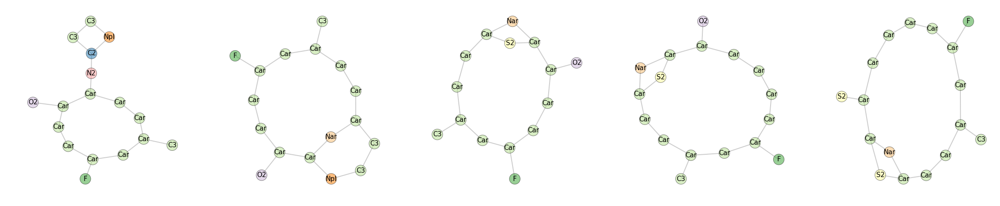


Graph id: 11


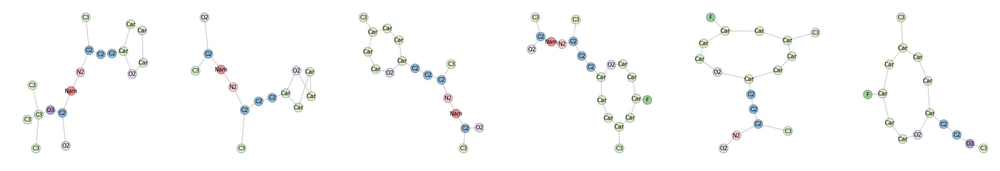

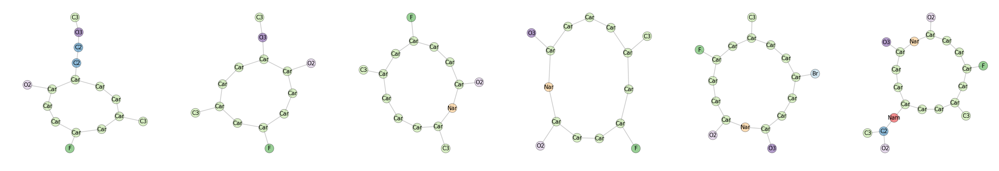

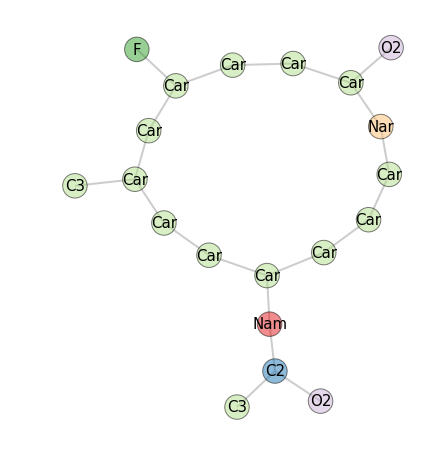


Graph id: 12


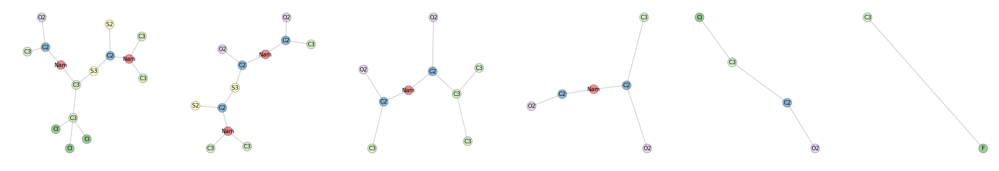

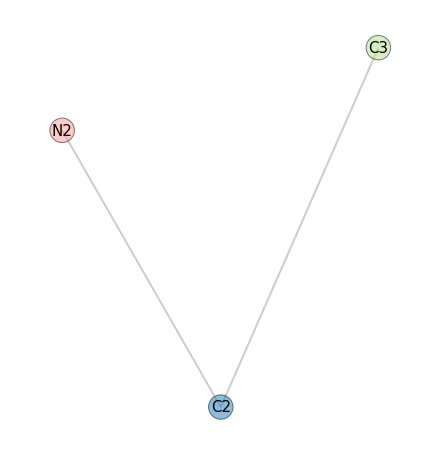


Graph id: 13


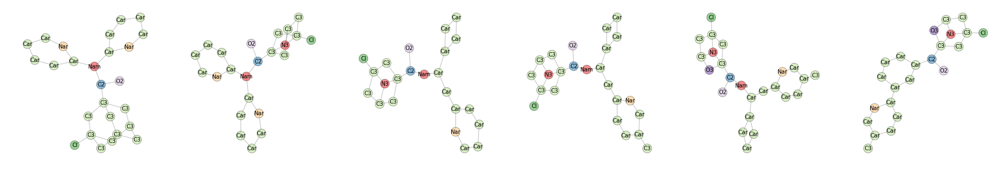

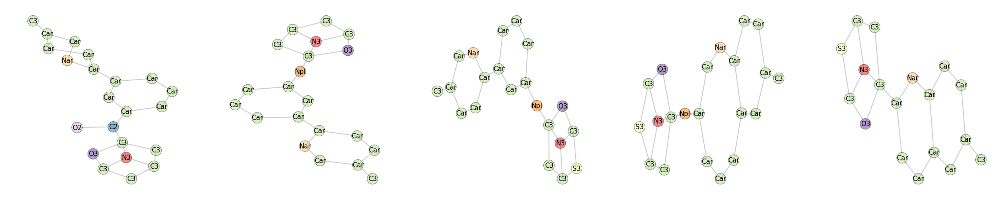


Graph id: 14


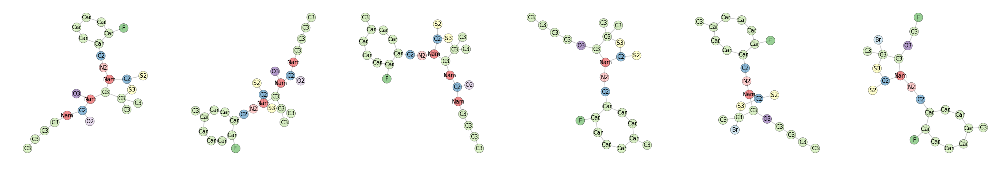

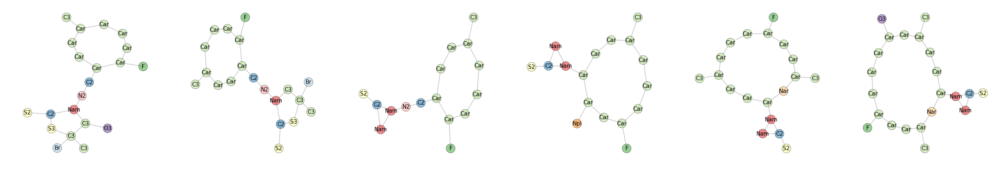

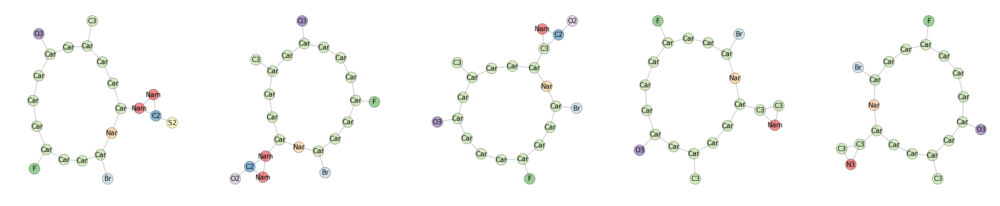


Graph id: 15


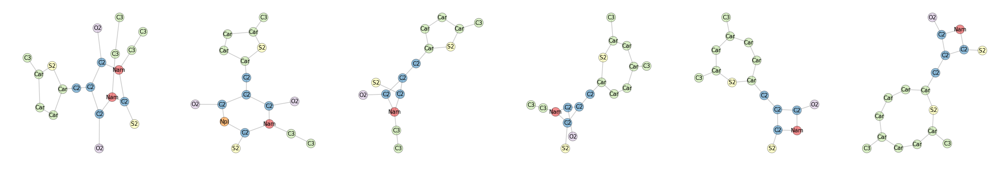

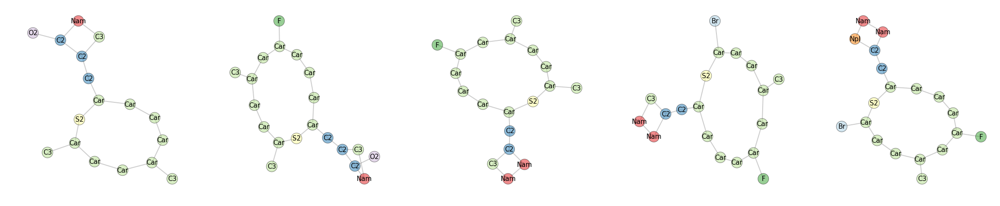


Graph id: 16


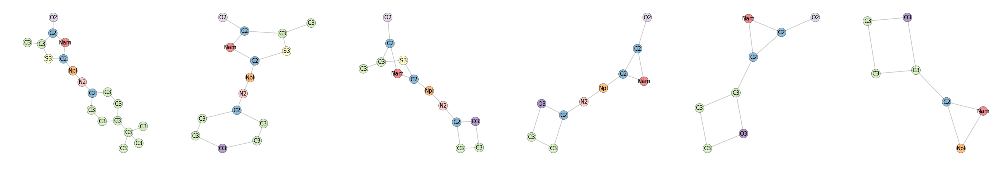


Graph id: 17


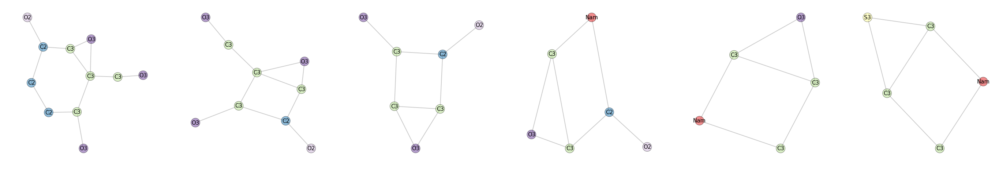

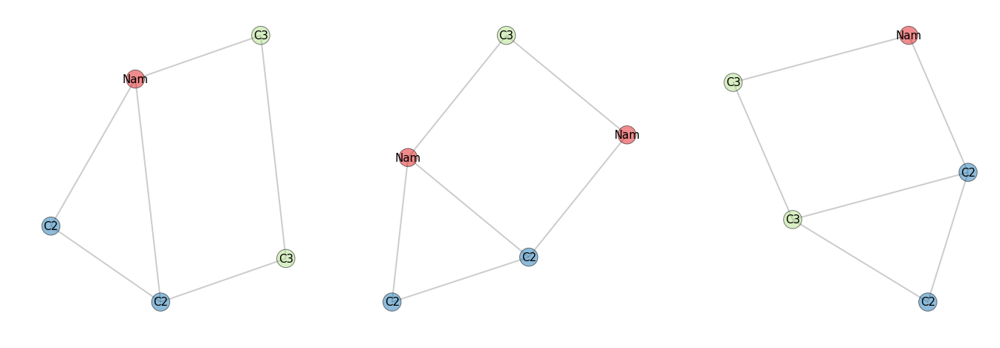


Graph id: 18


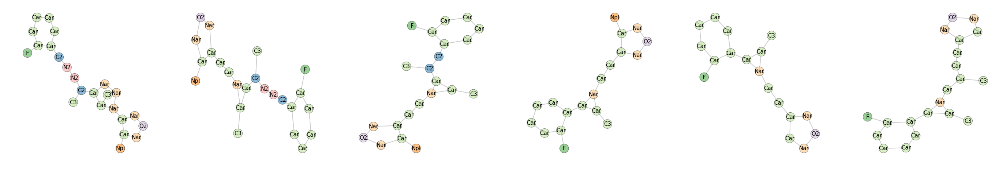

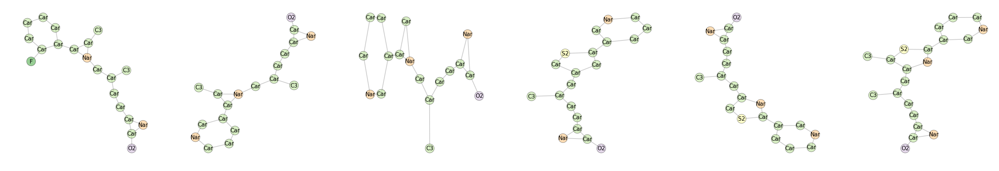

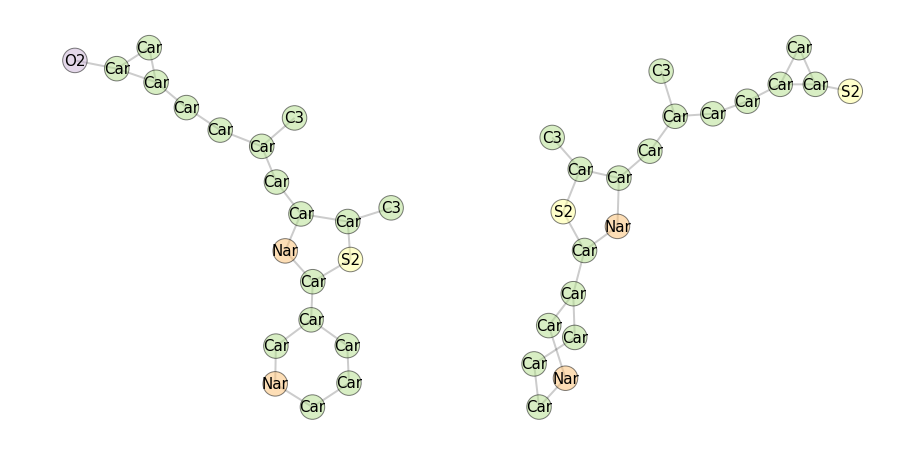


Graph id: 19


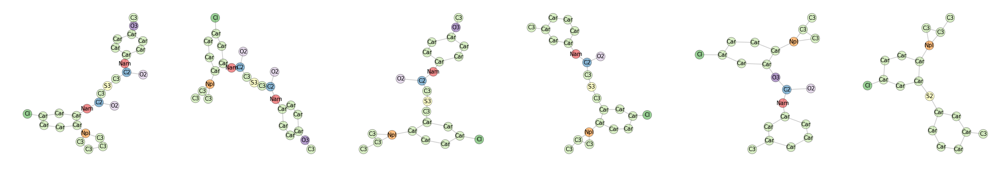

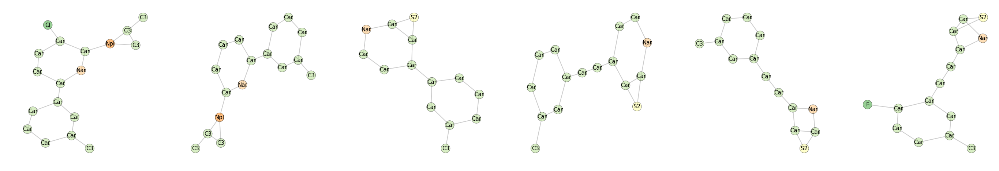


Graph id: 20


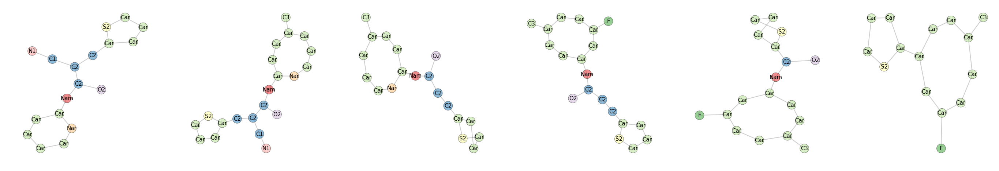

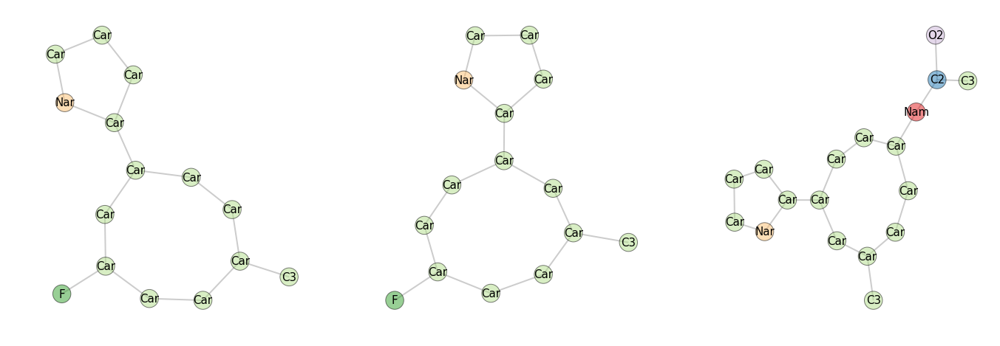


Graph id: 21


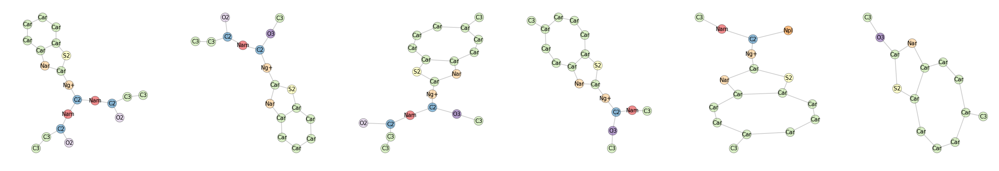

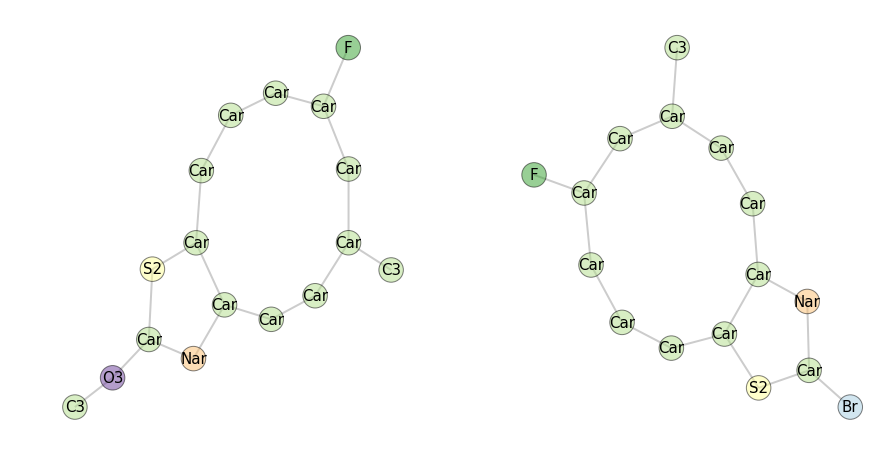


Graph id: 22


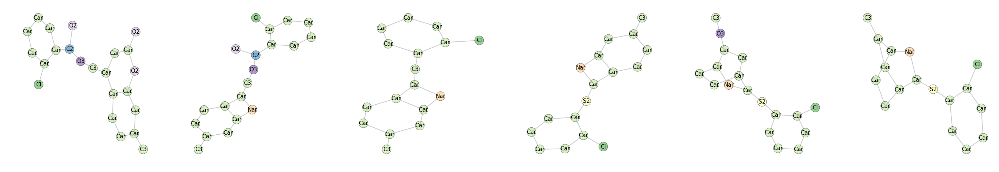

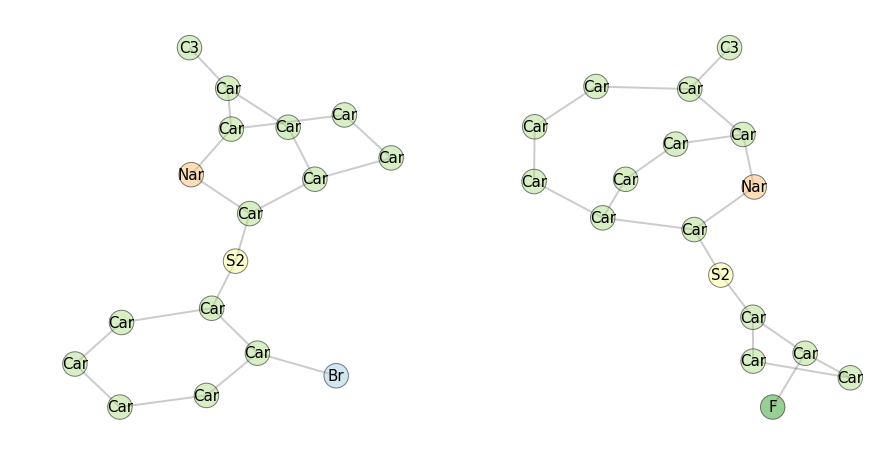


Graph id: 23


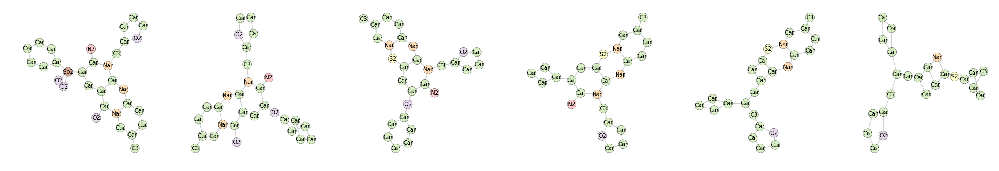

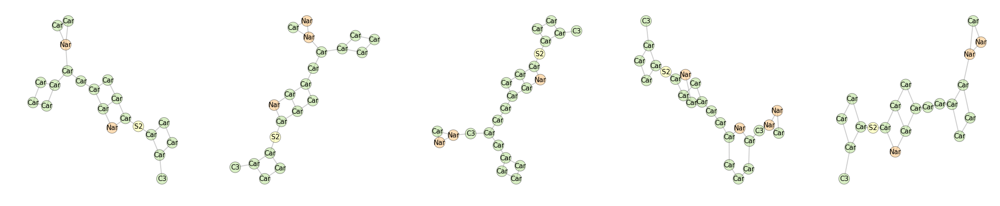

In [28]:
# display results
print('seed graphs')
draw.graphlearn(seed_graphs, **draw_params)

best_graphs = [sample_graphs[-1] for sample_graphs in sample_graphs_list]
print('best result')
best_id = select_most_central(best_graphs, vec)
best_graph = best_graphs[best_id]
draw.graphlearn([best_graph], **draw_params)

print('best graphs')
draw.graphlearn(best_graphs, **draw_params)

print('score history')
plot_scores(scores)

print('graph history')
for i, sample_graphs in enumerate(sample_graphs_list):
    print('\nGraph id: %d'%(i))
    draw.graphlearn(sample_graphs, **draw_params)

seed graphs


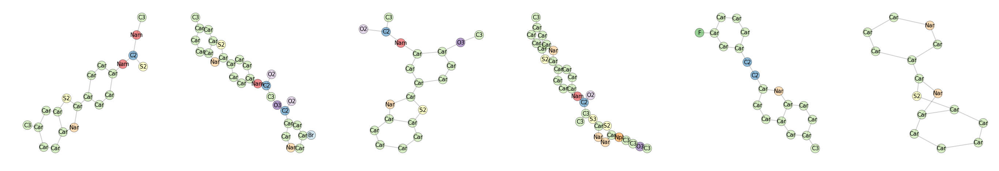

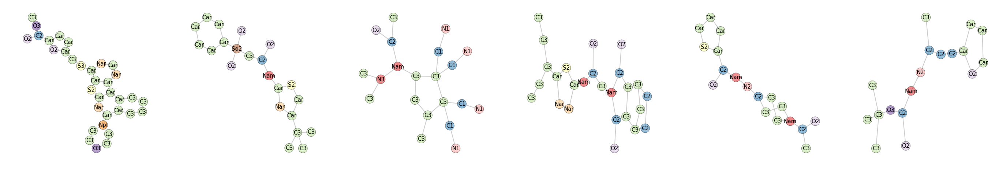

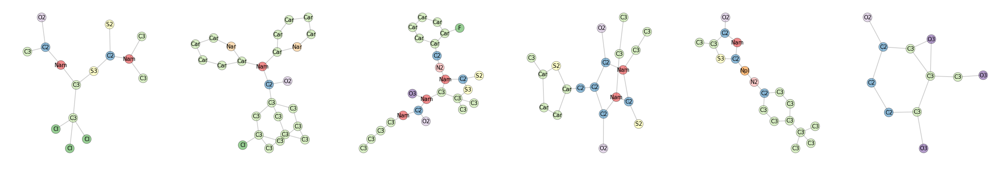

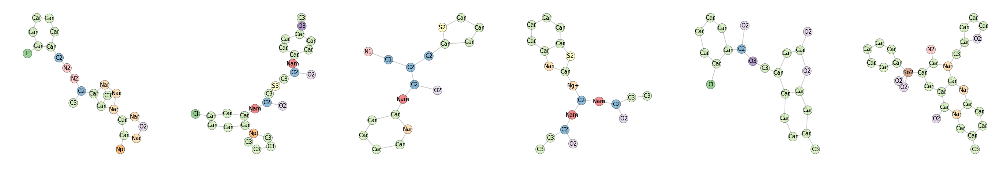

best result


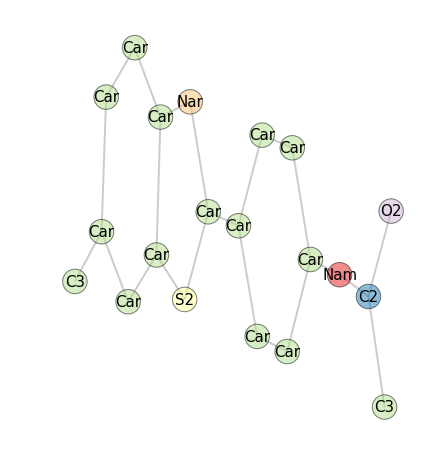

best 2 results


AttributeError: 'numpy.int64' object has no attribute 'graph'

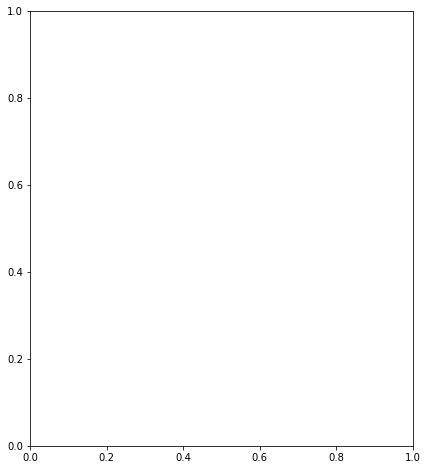

In [25]:
# display results
print('seed graphs')
draw.graphlearn(seed_graphs, **draw_params)

best_graphs = [sample_graphs[-1] for sample_graphs in sample_graphs_list]
print('best result')
best_id = select_most_central(best_graphs, vec)
best_graph = best_graphs[best_id]
draw.graphlearn([best_graph], **draw_params)

print('best 2 results')
prototype_graphs = prototypes(graphs, vec, n_clusters=2)
draw.graphlearn(prototype_graphs, **draw_params)

print('best 3 results')
prototype_graphs = prototypes(graphs, vec, n_clusters=3)
draw.graphlearn(prototype_graphs, **draw_params)

print('best graphs')
draw.graphlearn(best_graphs, **draw_params)

print('score history')
plot_scores(scores)

print('graph history')
for i, sample_graphs in enumerate(sample_graphs_list):
    print('\nGraph id: %d'%(i))
    draw.graphlearn(sample_graphs, **draw_params)

---